### Modify the file path according to your environment

In [ ]:
# This mounts your Google Drive to the Colab VM.
from google.colab import drive
drive.mount('/content/drive')

# TODO: Enter the foldername in your Drive where you have saved the unzipped
# assignment folder, e.g. 'CV_HW3/assignment3/'
FOLDERNAME = "ass3"
assert FOLDERNAME is not None, "[!] Enter the foldername."

# Now that we've mounted your Drive, this ensures that
# the Python interpreter of the Colab VM can load
# python files from within it.
import sys
sys.path.append('/content/drive/MyDrive/Colab Notebooks/{}'.format(FOLDERNAME))

# This downloads the COCO dataset to your Drive
# if it doesn't already exist.
%cd /content/drive/MyDrive/Colab Notebooks/ass3/CV/datasets
!bash get_datasets.sh

%cd /content/drive/MyDrive/Colab Notebooks/ass3

Mounted at /content/drive
/content/drive/MyDrive/Colab Notebooks/ass3/CV/datasets
/content/drive/MyDrive/Colab Notebooks/ass3


# Image Captioning with Transformers
You have now implemented a vanilla RNN and for the task of image captioning. In this notebook you will implement key pieces of a transformer decoder to accomplish the same task.

**NOTE:** This notebook will be primarily written in PyTorch rather than NumPy, unlike the RNN notebook.

In [ ]:
# Setup cell.
import time, os, json
import numpy as np
import matplotlib.pyplot as plt

from CV.gradient_check import eval_numerical_gradient, eval_numerical_gradient_array
from CV.transformer_layers import *
from CV.captioning_solver_transformer import CaptioningSolverTransformer
from CV.classifiers.transformer import CaptioningTransformer
from CV.coco_utils import load_coco_data, sample_coco_minibatch, decode_captions
from CV.image_utils import image_from_url

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # Set default size of plots.
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

%load_ext autoreload
%autoreload 2

def rel_error(x, y):
    """ returns relative error """
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

# COCO Dataset
As in the previous notebooks, we will use the COCO dataset for captioning.

In [ ]:
# Load COCO data from disk into a dictionary.
data = load_coco_data(pca_features=True)

# Print out all the keys and values from the data dictionary.
for k, v in data.items():
    if type(v) == np.ndarray:
        print(k, type(v), v.shape, v.dtype)
    else:
        print(k, type(v), len(v))

base dir  /content/drive/MyDrive/Colab Notebooks/ass3/CV/datasets/coco_captioning
train_captions <class 'numpy.ndarray'> (376490, 17) int32
train_image_idxs <class 'numpy.ndarray'> (376490,) int32
val_captions <class 'numpy.ndarray'> (184296, 17) int32
val_image_idxs <class 'numpy.ndarray'> (184296,) int32
train_features <class 'numpy.ndarray'> (82783, 512) float32
val_features <class 'numpy.ndarray'> (40504, 512) float32
idx_to_word <class 'list'> 50261
word_to_idx <class 'dict'> 50261
train_urls <class 'numpy.ndarray'> (82783,) <U71
val_urls <class 'numpy.ndarray'> (40504,) <U67
test_feature <class 'numpy.ndarray'> (1000, 4096) float32


# Transformer
As you have seen, RNNs are incredibly powerful but often slow to train. Further, RNNs struggle to encode long-range dependencies (though LSTMs are one way of mitigating the issue). In 2017, Vaswani et al introduced the Transformer in their paper ["Attention Is All You Need"](https://arxiv.org/abs/1706.03762) to a) introduce parallelism and b) allow models to learn long-range dependencies. The paper not only led to famous models like BERT and GPT in the natural language processing community, but also an explosion of interest across fields, including vision. While here we introduce the model in the context of image captioning, the idea of attention itself is much more general.



# Transformer: Multi-Headed Attention

### Dot-Product Attention

Recall that attention can be viewed as an operation on a query $q\in\mathbb{R}^d$, a set of value vectors $\{v_1,\dots,v_n\}, v_i\in\mathbb{R}^d$, and a set of key vectors $\{k_1,\dots,k_n\}, k_i \in \mathbb{R}^d$, specified as

\begin{align}
c = \sum_{i=1}^{n} v_i \alpha_i &\alpha_i = \frac{\exp(k_i^\top q)}{\sum_{j=1}^{n} \exp(k_j^\top q)} \\
\end{align}

where $\alpha_i$ are frequently called the "attention weights", and the output $c\in\mathbb{R}^d$ is a correspondingly weighted average over the value vectors.

### Self-Attention
In Transformers, we perform self-attention, which means that the values, keys and query are derived from the input $X \in \mathbb{R}^{\ell \times d}$, where $\ell$ is our sequence length. Specifically, we learn parameter matrices $V,K,Q \in \mathbb{R}^{d\times d}$ to map our input $X$ as follows:

\begin{align}
v_i = Vx_i\ \ i \in \{1,\dots,\ell\}\\
k_i = Kx_i\ \ i \in \{1,\dots,\ell\}\\
q_i = Qx_i\ \ i \in \{1,\dots,\ell\}
\end{align}

### Multi-Headed Scaled Dot-Product Attention
In the case of multi-headed attention, we learn a parameter matrix for each head, which gives the model more expressivity to attend to different parts of the input. Let $h$ be number of heads, and $Y_i$ be the attention output of head $i$. Thus we learn individual matrices $Q_i$, $K_i$ and $V_i$. To keep our overall computation the same as the single-headed case, we choose $Q_i \in \mathbb{R}^{d\times d/h}$, $K_i \in \mathbb{R}^{d\times d/h}$ and $V_i \in \mathbb{R}^{d\times d/h}$. Adding in a scaling term $\frac{1}{\sqrt{d/h}}$ to our simple dot-product attention above, we have

\begin{equation} \label{qkv_eqn}
Y_i = \text{softmax}\bigg(\frac{(XQ_i)(XK_i)^\top}{\sqrt{d/h}}\bigg)(XV_i)
\end{equation}

where $Y_i\in\mathbb{R}^{\ell \times d/h}$, where $\ell$ is our sequence length.

In our implementation, we apply dropout to the attention weights (though in practice it could be used at any step):

\begin{equation} \label{qkvdropout_eqn}
Y_i = \text{dropout}\bigg(\text{softmax}\bigg(\frac{(XQ_i)(XK_i)^\top}{\sqrt{d/h}}\bigg)\bigg)(XV_i)
\end{equation}

Finally, then the output of the self-attention is a linear transformation of the concatenation of the heads:

\begin{equation}
Y = [Y_1;\dots;Y_h]A
\end{equation}

were $A \in\mathbb{R}^{d\times d}$ and $[Y_1;\dots;Y_h]\in\mathbb{R}^{\ell \times d}$.

Implement multi-headed scaled dot-product attention in the `MultiHeadAttention` class in the file `CV/transformer_layers.py`. The code below will check your implementation. The relative error should be less than `e-3`.

In [ ]:
torch.manual_seed(231)

# Choose dimensions such that they are all unique for easier debugging:
# Specifically, the following values correspond to N=1, H=2, T=3, E//H=4, and E=8.
batch_size = 1
sequence_length = 3
embed_dim = 8
attn = MultiHeadAttention(embed_dim, num_heads=2)

# Self-attention.
data = torch.randn(batch_size, sequence_length, embed_dim)
self_attn_output, _ = attn(query=data, key=data, value=data)

# Masked self-attention.
mask = torch.randn(sequence_length, sequence_length) < 0.5
masked_self_attn_output, _ = attn(query=data, key=data, value=data, attn_mask=mask)

# Attention using two inputs.
other_data = torch.randn(batch_size, sequence_length, embed_dim)
attn_output, _ = attn(query=data, key=other_data, value=other_data)

expected_self_attn_output = np.asarray([[
[-0.2494,  0.1396,  0.4323, -0.2411, -0.1547,  0.2329, -0.1936,
          -0.1444],
         [-0.1997,  0.1746,  0.7377, -0.3549, -0.2657,  0.2693, -0.2541,
          -0.2476],
         [-0.0625,  0.1503,  0.7572, -0.3974, -0.1681,  0.2168, -0.2478,
          -0.3038]]])

expected_masked_self_attn_output = np.asarray([[
[-0.1347,  0.1934,  0.8628, -0.4903, -0.2614,  0.2798, -0.2586,
          -0.3019],
         [-0.1013,  0.3111,  0.5783, -0.3248, -0.3842,  0.1482, -0.3628,
          -0.1496],
         [-0.2071,  0.1669,  0.7097, -0.3152, -0.3136,  0.2520, -0.2774,
          -0.2208]]])

expected_attn_output = np.asarray([[
[-0.1980,  0.4083,  0.1968, -0.3477,  0.0321,  0.4258, -0.8972,
          -0.2744],
         [-0.1603,  0.4155,  0.2295, -0.3485, -0.0341,  0.3929, -0.8248,
          -0.2767],
         [-0.0908,  0.4113,  0.3017, -0.3539, -0.1020,  0.3784, -0.7189,
          -0.2912]]])

print('self_attn_output error: ', rel_error(expected_self_attn_output, self_attn_output.detach().numpy()))
print('masked_self_attn_output error: ', rel_error(expected_masked_self_attn_output, masked_self_attn_output.detach().numpy()))
print('attn_output error: ', rel_error(expected_attn_output, attn_output.detach().numpy()))

self_attn_output error:  0.0003775124598178026
masked_self_attn_output error:  0.0001526367643724865
attn_output error:  0.0003530104862933477


# Positional Encoding

While transformers are able to easily attend to any part of their input, the attention mechanism has no concept of token order. However, for many tasks (especially natural language processing), relative token order is very important. To recover this, the authors add a positional encoding to the embeddings of individual word tokens.

Let us define a matrix $P \in \mathbb{R}^{l\times d}$, where $P_{ij} = $

$$
\begin{cases}
\text{sin}\left(i \cdot 10000^{-\frac{j}{d}}\right) & \text{if j is even} \\
\text{cos}\left(i \cdot 10000^{-\frac{(j-1)}{d}}\right) & \text{otherwise} \\
\end{cases}
$$

Rather than directly passing an input $X \in \mathbb{R}^{l\times d}$ to our network, we instead pass $X + P$.

Implement this layer in `PositionalEncoding` in `CV/transformer_layers.py`. Once you are done, run the following to perform a simple test of your implementation. You should see errors on the order of `e-3` or less.

In [ ]:
torch.manual_seed(231)

batch_size = 1
sequence_length = 2
embed_dim = 6
data = torch.randn(batch_size, sequence_length, embed_dim)

pos_encoder = PositionalEncoding(embed_dim)
output = pos_encoder(data)

expected_pe_output = np.asarray([[[-1.2340,  1.1127,  1.6978, -0.0865, -0.0000,  1.2728],
                                  [ 0.9028, -0.4781,  0.5535,  0.8133,  1.2644,  1.7034]]])

print('pe_output error: ', rel_error(expected_pe_output, output.detach().numpy()))

pe_output error:  0.00010421011374914356


# Transformer for Image Captioning
Now that you have implemented the previous layers, you can combine them to build a Transformer-based image captioning model. Open the file `CV/classifiers/transformer.py` and look at the `CaptioningTransformer` class.

Implement the `forward` function of the class. After doing so, run the following to check your forward pass using a small test case; you should see error on the order of `e-5` or less.

In [ ]:
torch.manual_seed(231)
np.random.seed(231)

N, D, W = 4, 20, 30
word_to_idx = {'<NULL>': 0, 'cat': 2, 'dog': 3}
V = len(word_to_idx)
T = 3

transformer = CaptioningTransformer(
    word_to_idx,
    input_dim=D,
    wordvec_dim=W,
    num_heads=2,
    num_layers=2,
    max_length=50 # edit
)

# Set all model parameters to fixed values
for p in transformer.parameters():
    p.data = torch.tensor(np.linspace(-1.4, 1.3, num=p.numel()).reshape(*p.shape))

features = torch.tensor(np.linspace(-1.5, 0.3, num=(N * D)).reshape(N, D))
captions = torch.tensor((np.arange(N * T) % V).reshape(N, T))

scores, _ = transformer.forward(features, captions)
expected_scores = np.asarray([[[-16.9532,   4.8261,  26.6054],
         [-17.1033,   4.6906,  26.4844],
         [-15.0708,   4.1108,  23.2924]],
        [[-17.1767,   4.5897,  26.3562],
         [-15.6017,   4.8693,  25.3403],
         [-15.1028,   4.6905,  24.4839]],
        [[-17.2172,   4.7701,  26.7574],
         [-16.6755,   4.8500,  26.3754],
         [-17.2172,   4.7701,  26.7574]],
        [[-16.3669,   4.1602,  24.6872],
         [-16.7897,   4.3467,  25.4831],
         [-17.0103,   4.7775,  26.5652]]])
print('scores error: ', rel_error(expected_scores, scores.detach().cpu().numpy()))

scores error:  5.056720614342753e-06


# Overfit Transformer Captioning Model on Small Data
Run the following to overfit the Transformer-based captioning model on the same small dataset as we used for the RNN previously.

base dir  /content/drive/MyDrive/Colab Notebooks/ass3/CV/datasets/coco_captioning
(Iteration 1 / 200) loss: 10.774050
(Iteration 11 / 200) loss: 5.140417
(Iteration 21 / 200) loss: 3.637037
(Iteration 31 / 200) loss: 2.506638
(Iteration 41 / 200) loss: 2.065363
(Iteration 51 / 200) loss: 1.743033
(Iteration 61 / 200) loss: 1.393008
(Iteration 71 / 200) loss: 1.181169
(Iteration 81 / 200) loss: 0.895096
(Iteration 91 / 200) loss: 0.722529
(Iteration 101 / 200) loss: 0.532726
(Iteration 111 / 200) loss: 0.488428
(Iteration 121 / 200) loss: 0.429122
(Iteration 131 / 200) loss: 0.395994
(Iteration 141 / 200) loss: 0.386540
(Iteration 151 / 200) loss: 0.344092
(Iteration 161 / 200) loss: 0.280710
(Iteration 171 / 200) loss: 0.353365
(Iteration 181 / 200) loss: 0.278648
(Iteration 191 / 200) loss: 0.290901


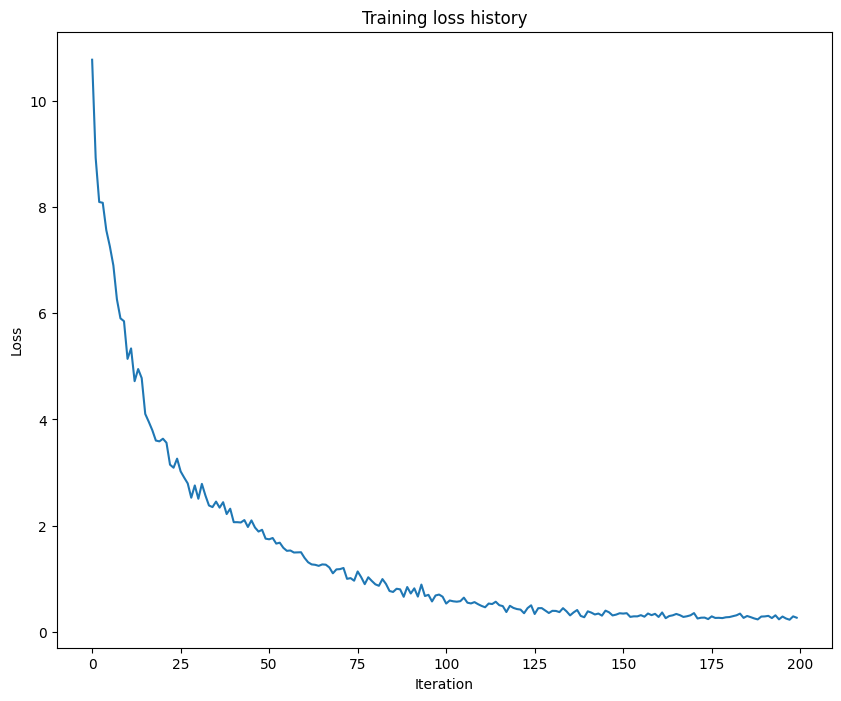

In [ ]:
torch.manual_seed(231)
np.random.seed(231)

data = load_coco_data(max_train=50)

transformer = CaptioningTransformer(
          word_to_idx=data['word_to_idx'],
          input_dim=data['train_features'].shape[1],
          wordvec_dim=256,
          num_heads=2,
          num_layers=2,
          max_length=50
        )


transformer_solver = CaptioningSolverTransformer(transformer, data, idx_to_word=data['idx_to_word'],
           num_epochs=100,
           batch_size=25,
           learning_rate=0.001,
           verbose=True, print_every=10,
         )

transformer_solver.train()

# Plot the training losses.
plt.plot(transformer_solver.loss_history)
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Training loss history')
plt.show()

Print final training loss. You should see a final loss of less than 0.03.

In [ ]:
print('Final loss: ', transformer_solver.loss_history[-1])

Final loss:  0.2664486


# Transformer Sampling at Test Time
The sampling code has been written for you. You can simply run the following to compare with the previous results with the RNN. As before the training results should be much better than the validation set results, given how little data we trained on.

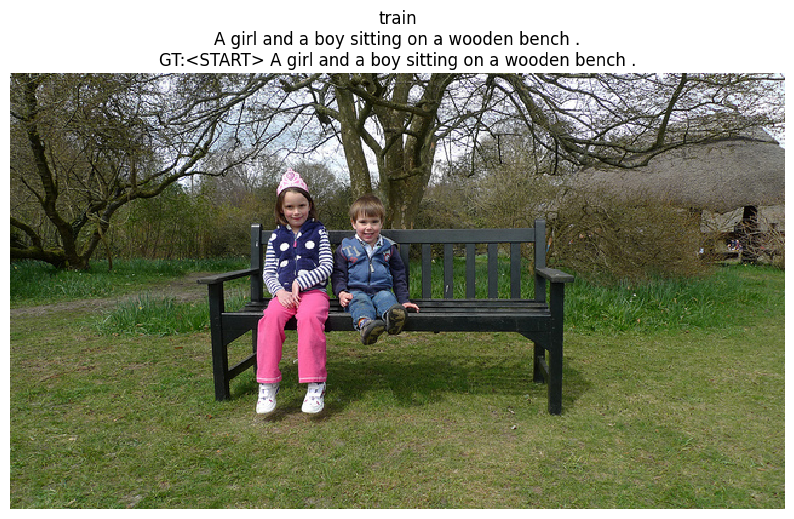

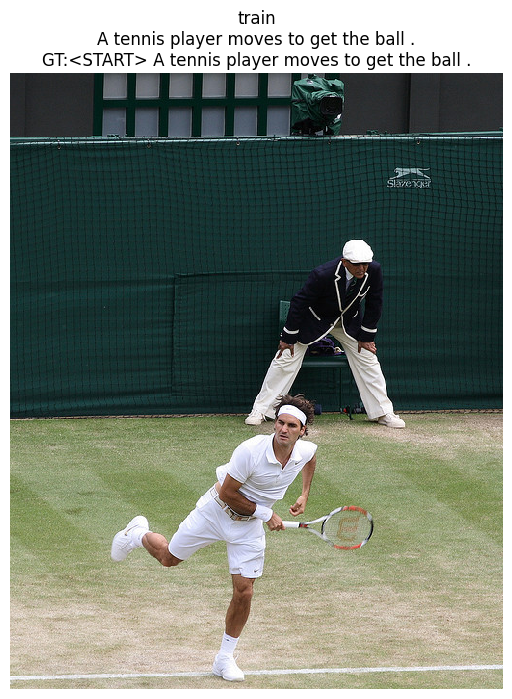

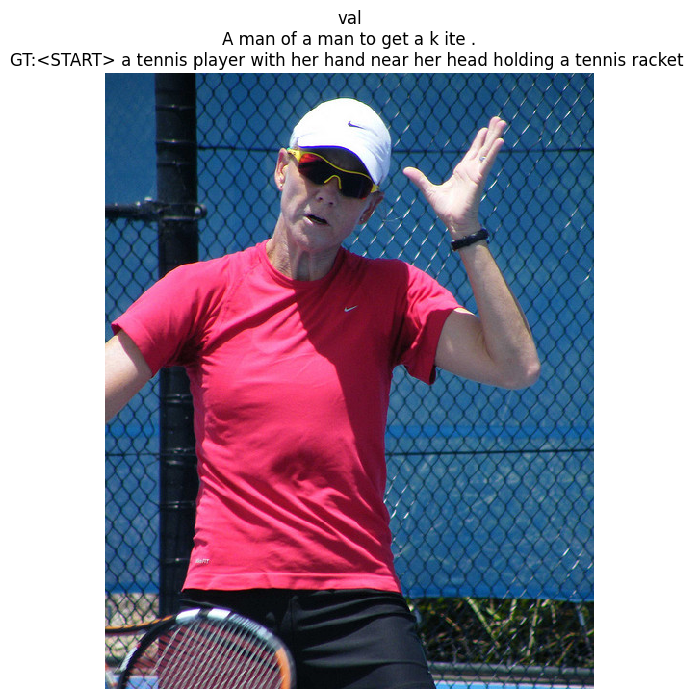

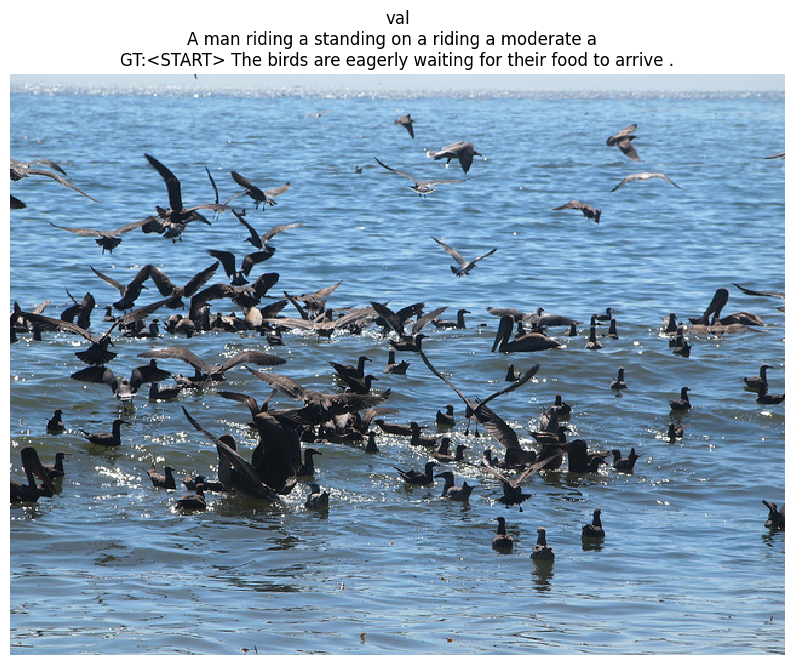

In [ ]:
# If you get an error, the URL just no longer exists, so don't worry!
# You can re-sample as many times as you want.
for split in ['train', 'val']:
    minibatch = sample_coco_minibatch(data, split=split, batch_size=2)
    gt_captions, features, urls = minibatch
    gt_captions = decode_captions(gt_captions, data['idx_to_word'])

    sample_captions = transformer.sample(features, max_length=30)
    sample_captions = decode_captions(sample_captions, data['idx_to_word'])

    for gt_caption, sample_caption, url in zip(gt_captions, sample_captions, urls):
        img = image_from_url(url)
        # Skip missing URLs.
        if img is None: continue
        plt.imshow(img)
        plt.title('%s\n%s\nGT:%s' % (split, sample_caption, gt_caption))
        plt.axis('off')
        plt.show()

# Train Transformer Captioning Model on entire datasets.
This might take while.


base dir  /content/drive/MyDrive/Colab Notebooks/ass3/CV/datasets/coco_captioning
(Iteration 1 / 117640) loss: 10.920474
(Iteration 1001 / 117640) loss: 2.792408
(Iteration 2001 / 117640) loss: 2.218241
(Iteration 3001 / 117640) loss: 2.182121
(Iteration 4001 / 117640) loss: 2.139815
(Iteration 5001 / 117640) loss: 1.963934
(Iteration 6001 / 117640) loss: 2.176220
(Iteration 7001 / 117640) loss: 1.973529
(Iteration 8001 / 117640) loss: 2.118995
(Iteration 9001 / 117640) loss: 2.072711
(Iteration 10001 / 117640) loss: 1.776060
(Iteration 11001 / 117640) loss: 1.762986
(Iteration 12001 / 117640) loss: 1.832475
(Iteration 13001 / 117640) loss: 2.035525
(Iteration 14001 / 117640) loss: 1.822721
(Iteration 15001 / 117640) loss: 1.836772
(Iteration 16001 / 117640) loss: 1.846071
(Iteration 17001 / 117640) loss: 1.790979
(Iteration 18001 / 117640) loss: 1.807094
(Iteration 19001 / 117640) loss: 1.744870
(Iteration 20001 / 117640) loss: 1.813134
(Iteration 21001 / 117640) loss: 1.840146
(Itera

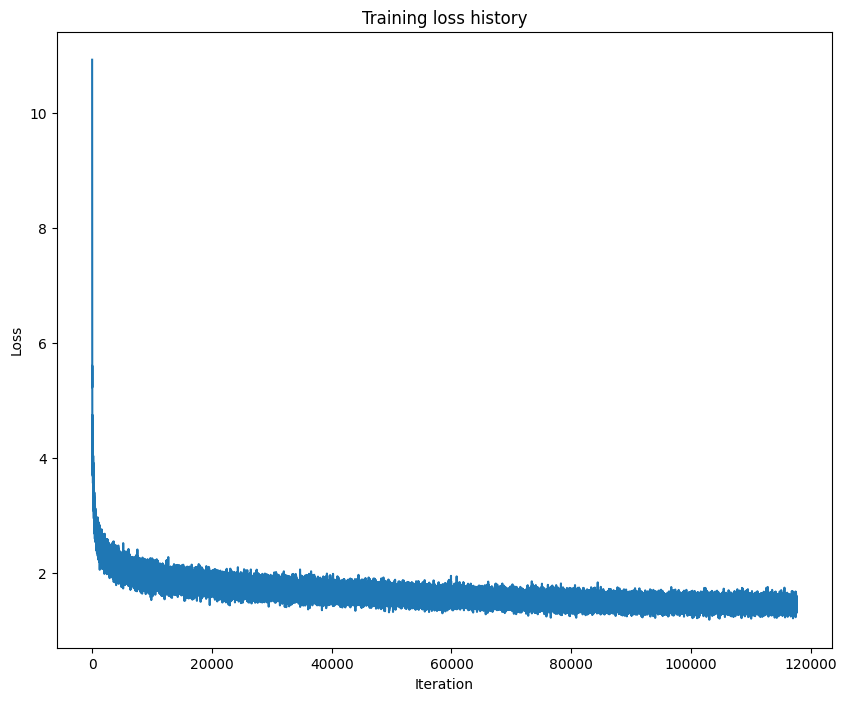

In [ ]:
torch.manual_seed(231)
np.random.seed(231)

data = load_coco_data(pca_features=False)

transformer = CaptioningTransformer(
          word_to_idx=data['word_to_idx'],
          input_dim=data['train_features'].shape[1],
          wordvec_dim=256,
          num_heads=2,
          num_layers=2,
          max_length=50 # edit
        )


transformer_solver = CaptioningSolverTransformer(transformer, data, idx_to_word=data['idx_to_word'],
           num_epochs=20,
           batch_size=64, # hyperparameter tuning
           learning_rate=5e-4, # hyperparameter tuning
           verbose=True, print_every=1000,
         )

transformer_solver.train()

# Plot the training losses.
plt.plot(transformer_solver.loss_history)
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Training loss history')
plt.show()

# Transformer Sampling at Test Time
The sampling code has been written for you. You can simply run the following to compare with the previous results.

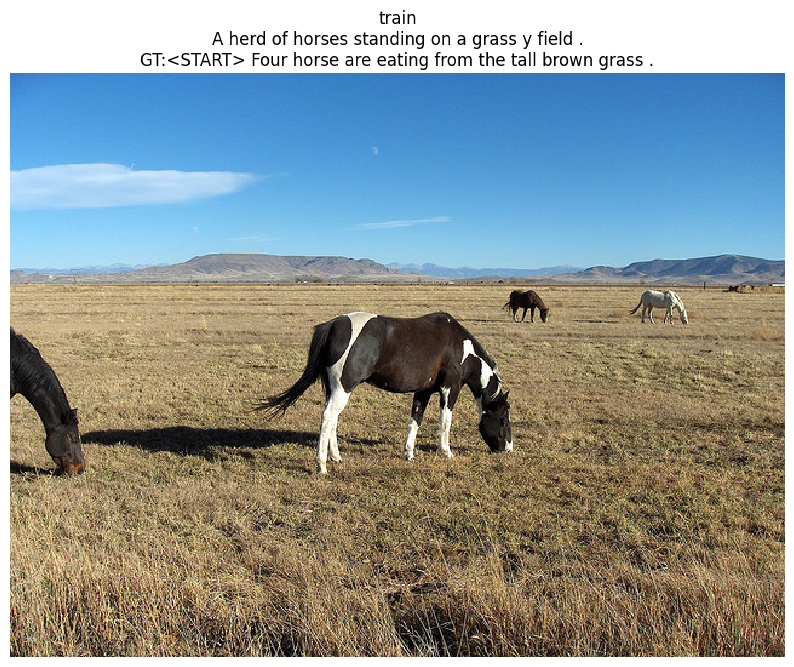

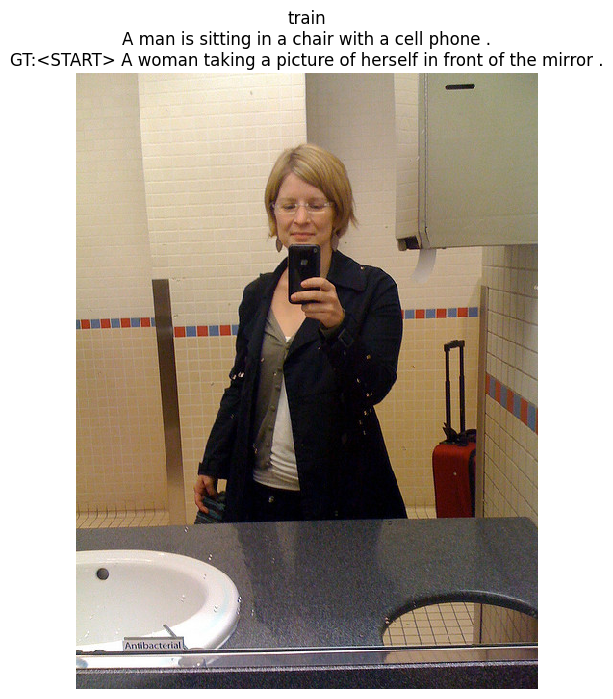

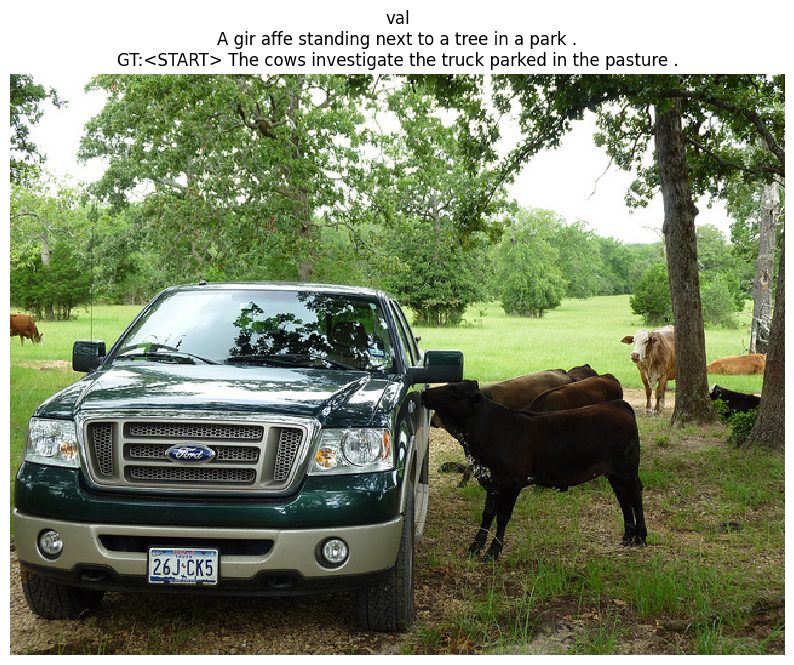

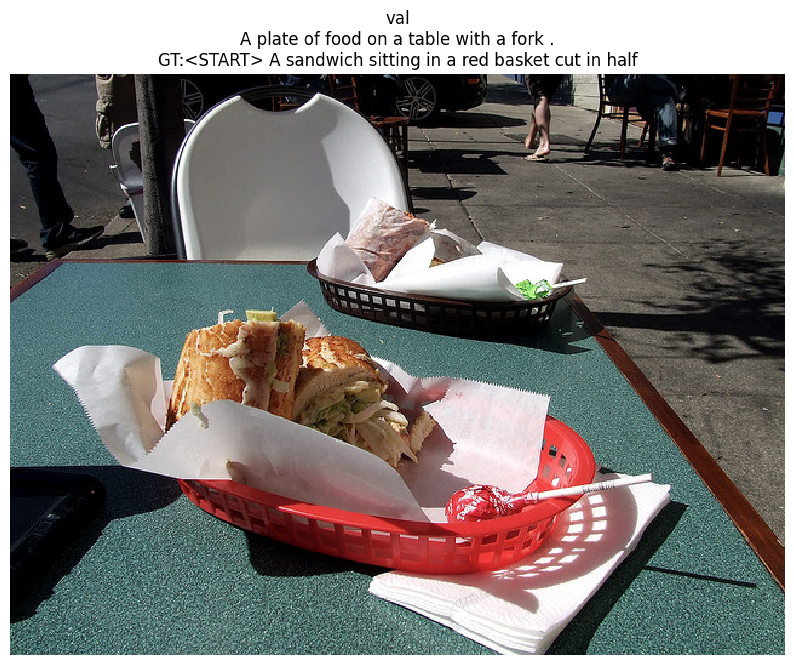

In [ ]:
# If you get an error, the URL just no longer exists, so don't worry!
# You can re-sample as many times as you want.
for split in ['train', 'val']:
    minibatch = sample_coco_minibatch(data, split=split, batch_size=2)
    gt_captions, features, urls = minibatch
    gt_captions = decode_captions(gt_captions, data['idx_to_word'])

    sample_captions = transformer.sample(features, max_length=30)
    sample_captions = decode_captions(sample_captions, data['idx_to_word'])

    for gt_caption, sample_caption, url in zip(gt_captions, sample_captions, urls):
        img = image_from_url(url)
        # Skip missing URLs.
        if img is None: continue
        plt.imshow(img)
        plt.title('%s\n%s\nGT:%s' % (split, sample_caption, gt_caption))
        plt.axis('off')
        plt.show()

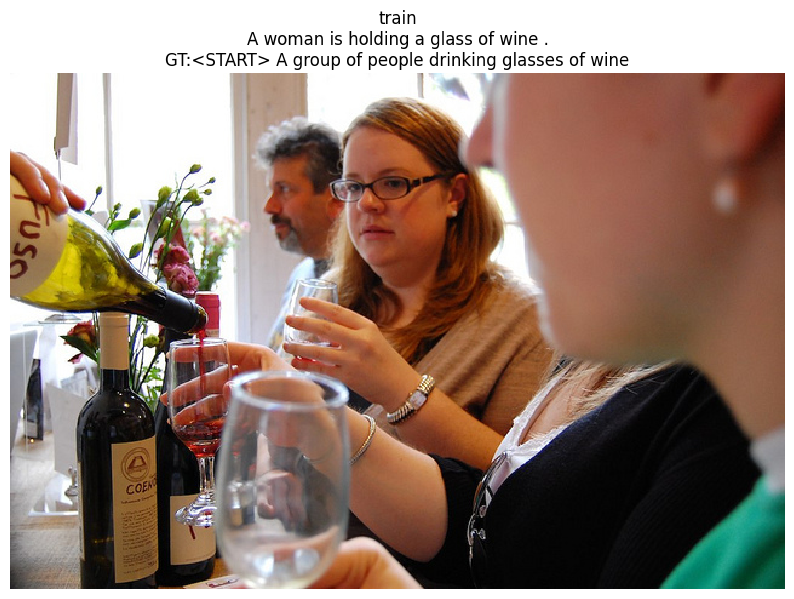

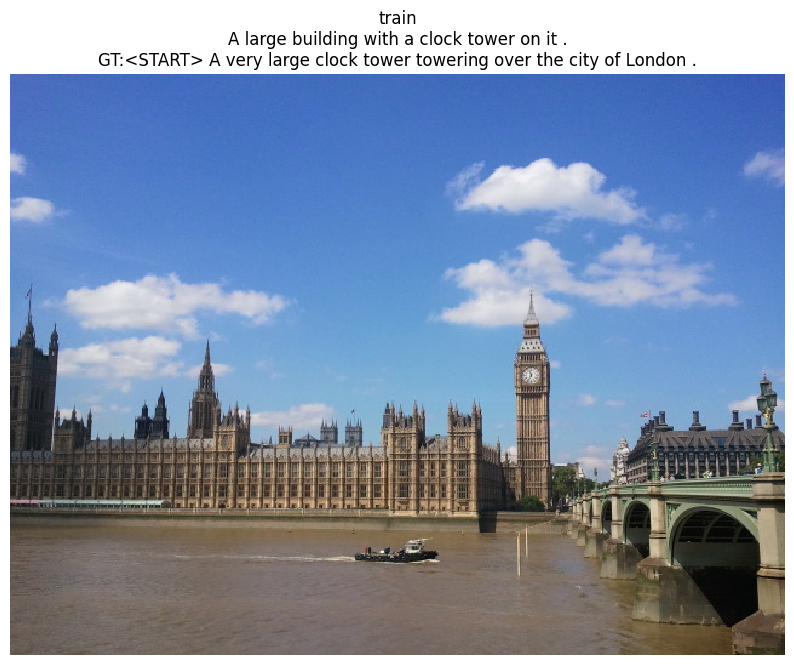

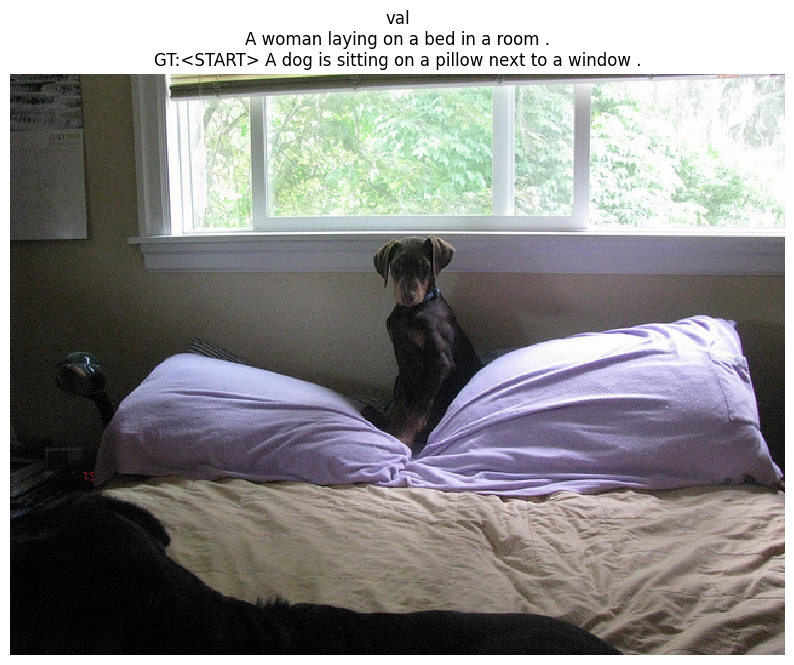

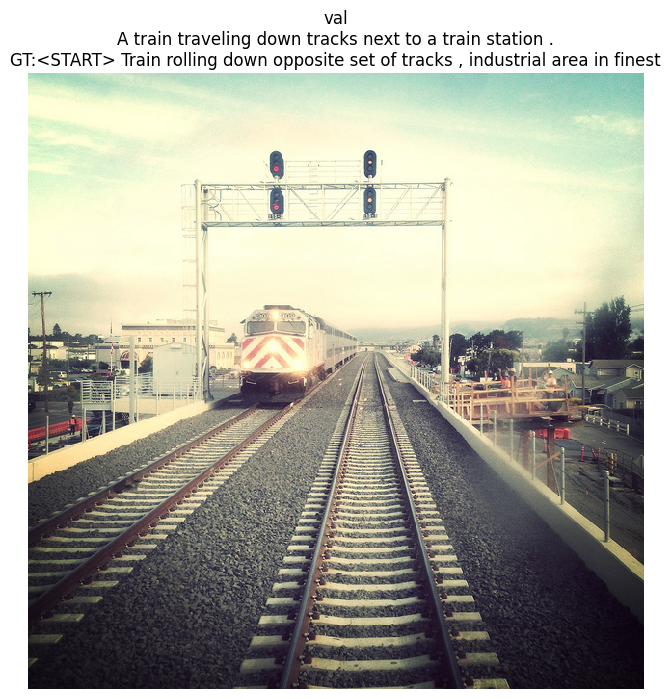

In [ ]:
# more examples
for split in ['train', 'val']:
    minibatch = sample_coco_minibatch(data, split=split, batch_size=2)
    gt_captions, features, urls = minibatch
    gt_captions = decode_captions(gt_captions, data['idx_to_word'])

    sample_captions = transformer.sample(features, max_length=30)
    sample_captions = decode_captions(sample_captions, data['idx_to_word'])

    for gt_caption, sample_caption, url in zip(gt_captions, sample_captions, urls):
        img = image_from_url(url)
        # Skip missing URLs.
        if img is None: continue
        plt.imshow(img)
        plt.title('%s\n%s\nGT:%s' % (split, sample_caption, gt_caption))
        plt.axis('off')
        plt.show()

# CIDEr Score

In [ ]:
!pip install pycocotools
!pip install pycocoevalcap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.3/104.3 MB 21.5 MB/s eta 0:00:00


In [ ]:
from pycocoevalcap.cider.cider import Cider

def format_captions_for_cider(decoded_captions):
    caps_dict = {}
    for i, caption in enumerate(decoded_captions):
        caps_dict[i] = [caption]
    return caps_dict

def calculate_cider_score(model, data, split='val', batch_size=100):
    if hasattr(model, 'eval'):
        model.eval()

    gt_captions_dict = {}
    pred_captions_dict = {}

    num_samples = data[f'{split}_features'].shape[0]
    num_batches = int(np.ceil(num_samples / batch_size))

    image_id_counter = 0

    print(f'Calculating CIDEr score on {split} set...')
    for i in range(num_batches):
        minibatch = sample_coco_minibatch(data, split=split, batch_size=batch_size)
        gt_captions, features, _ = minibatch

        if isinstance(model, torch.nn.Module):
            # Transformer
            sampled_captions = model.sample(features, max_length=30)
        else:
            # RNN/LSTM
            sampled_captions = model.sample(features, max_length=30)

        decoded_gt = decode_captions(gt_captions, data['idx_to_word'])
        decoded_pred = decode_captions(sampled_captions, data['idx_to_word'])

        for j in range(len(decoded_gt)):
            gt_captions_dict[image_id_counter] = [decoded_gt[j]]
            pred_captions_dict[image_id_counter] = [decoded_pred[j]]
            image_id_counter += 1

    cider_scorer = Cider()
    cider_score, _ = cider_scorer.compute_score(gt_captions_dict, pred_captions_dict)

    print(f'CIDEr Score on {split} set: {cider_score:.4f}')

    if hasattr(model, 'train'):
        model.train()

    return cider_score

trained_transformer_model = transformer_solver.model

In [ ]:
validation_cider = calculate_cider_score(trained_transformer_model, data, split='val')

Calculating CIDEr score on val set...
CIDEr Score on val set: 0.6937


# Attention Map(self-attention) Visualization

Ground Truth: <START> A hotel room with a large bed and a tv
Generating caption and self-attention heatmap...


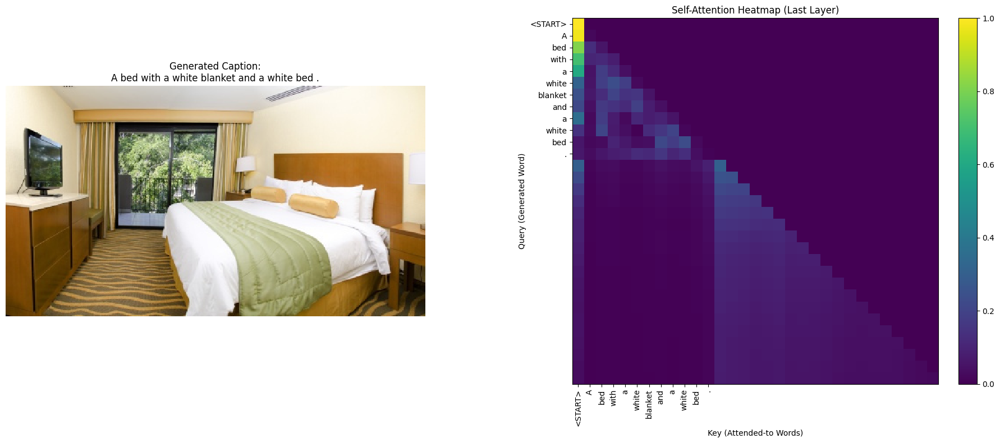

In [ ]:
minibatch = sample_coco_minibatch(data, split='val', batch_size=1)
gt_captions, features, urls = minibatch

image_feature = features[0:1]
image_url = urls[0]

print(f"Ground Truth: {decode_captions(gt_captions, data['idx_to_word'])[0]}")
transformer_solver.model.visualize_self_attention_heatmap(image_feature, image_url, data)

Ground Truth: <START> A woman is holding an iPhone and trying to take a picture .
Generating caption and self-attention heatmap...


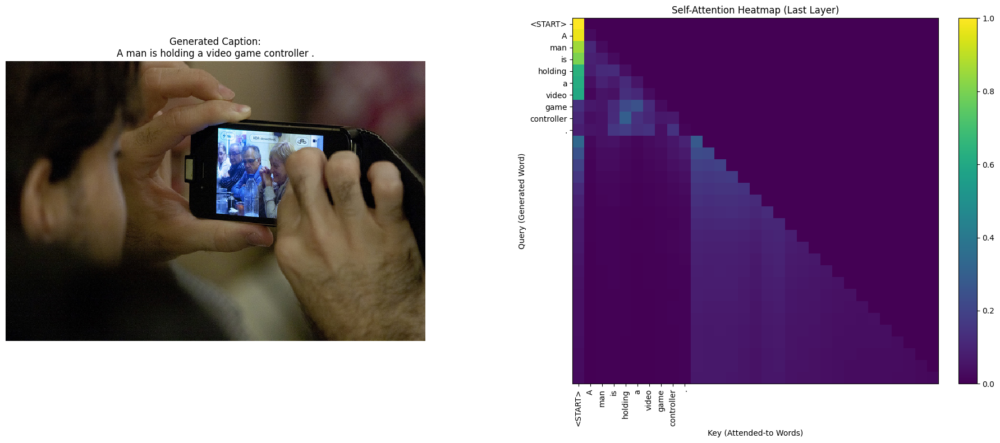

In [ ]:
# more example for attention map visualization

minibatch = sample_coco_minibatch(data, split='val', batch_size=1)
gt_captions, features, urls = minibatch

image_feature = features[0:1]
image_url = urls[0]

print(f"Ground Truth: {decode_captions(gt_captions, data['idx_to_word'])[0]}")
transformer_solver.model.visualize_self_attention_heatmap(image_feature, image_url, data)

# Try your model on test set.


In [ ]:
import json
import os
from tqdm import tqdm

base_dir = '/content/drive/MyDrive/Colab Notebooks/ass3/CV/datasets/coco_captioning'

model = transformer_solver.model
idx_to_word = data['idx_to_word']

def generate_caption(feature):
    # FIXME
    feature = feature.reshape(1, -1)
    caption_ids = model.sample(feature, max_length=30)
    caption_text = decode_captions(caption_ids, idx_to_word)[0]
    return caption_text

student_id = "2021002706" # FIXME
pred = []

test_feat_path = os.path.join(base_dir, "test_feat.npy")

test_feat = np.load(test_feat_path)
test_feat = np.expand_dims(test_feat, axis=1)

for i in tqdm(range(len(test_feat))):
    caption = generate_caption(test_feat[i])
    image_id = i + 1
    pred.append({'image_id' : image_id, 'caption' : caption})

result = {"student_id" : student_id, "prediction" : pred}
json.dump(result, open('pred.json', 'w'))

100%|██████████| 1000/1000 [01:23<00:00, 11.98it/s]
